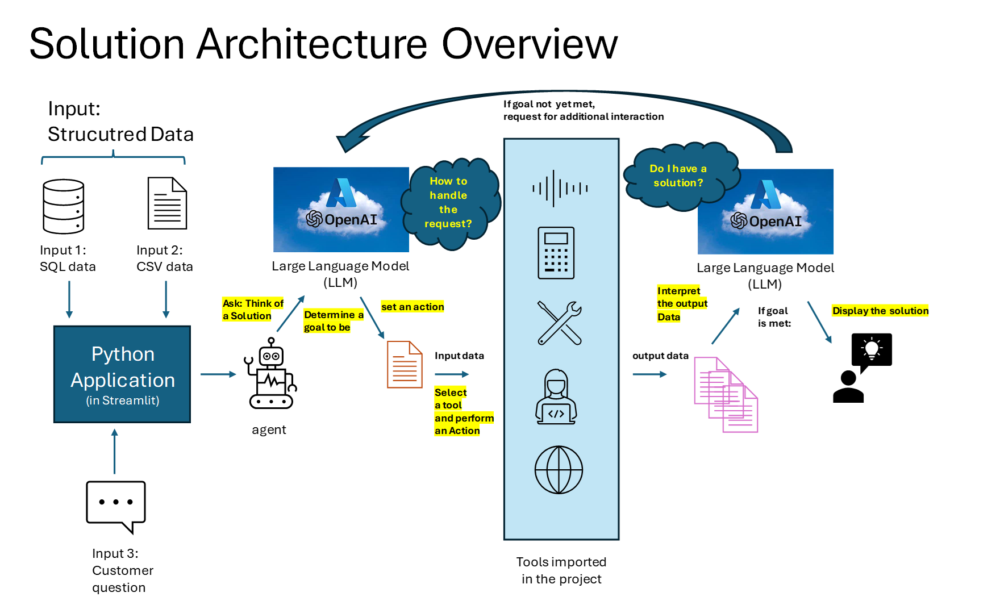

# Introduction
This script demonstrates two use cases of interacting with structure data.

The technique here requires two main components:
- using the AzureChatOpenAI model as a large language model
- using langchain_openai library as a framework and agent orchestrator. 

The key concepts highlighted in this script include environment variable management, database connection, SQL querying, and the use of AI models for data interaction.

## Objectives
In this script, Generative AI uses resource deployed in Azure. The AzureChatOpenAI model is used to interact with a SQL database and a CSV file. 

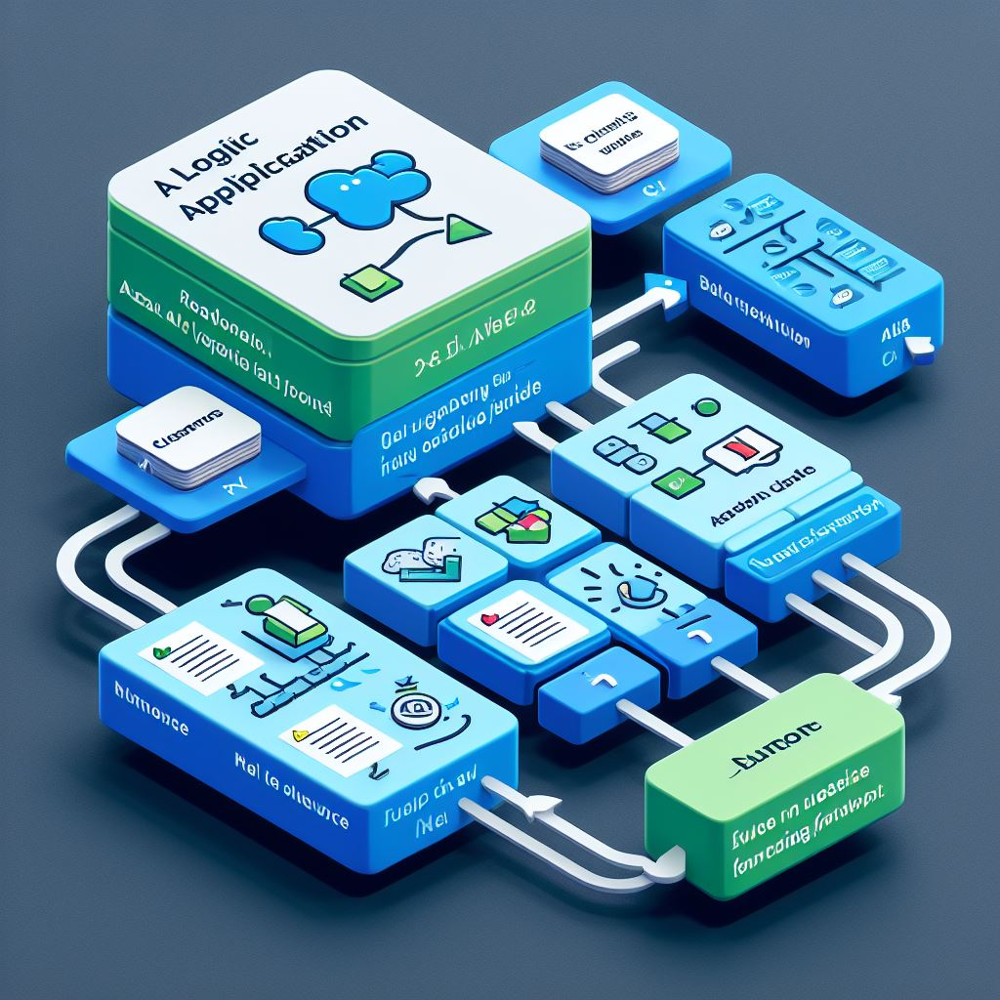


In [1]:
## Importing necessary libraries

#System Variables
import os
from dotenv import load_dotenv

## Obtaining the Keys
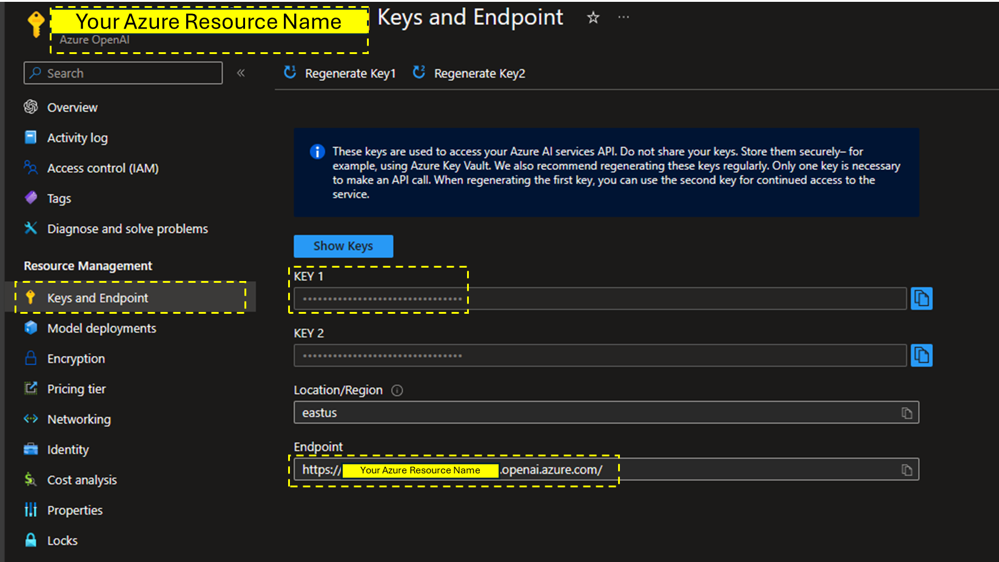

In [2]:
# Loading Azure Open AI Resource environment variables from ".env" file outside the code under the same directory
load_dotenv()

# Accessing environment variables
os.environ["OPENAI_API_TYPE"] 
os.environ["OPENAI_API_VERSION"] 
os.environ["AZURE_OPENAI_ENDPOINT"] 
os.environ["OPENAI_API_KEY"] 
os.environ["AZURE_COGS_KEY"] 
os.environ["AZURE_COGS_ENDPOINT"] 
os.environ["AZURE_COGS_REGION"] 

'eastus'

## Creating a Deployment in Azure OpenAI

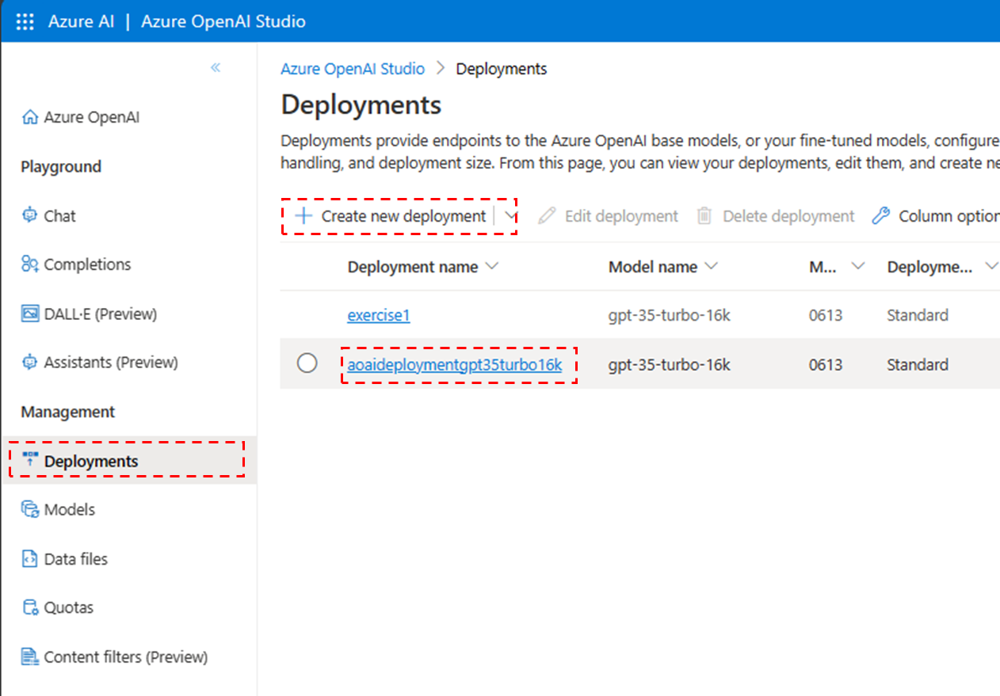

In [3]:
# Importing AzureChatOpenAI from langchain_openai
from langchain_openai import AzureChatOpenAI

# Creating an instance of AzureChatOpenAI
llm = AzureChatOpenAI(
    deployment_name='gpt-4-deployment',
    openai_api_type="azure",
    temperature = 0
)

### Task 1 of 2 - Interacting with SQL Data
The First Section sets up the environment variables and initializes the AzureChatOpenAI model. It then connects to a SQL database, retrieves the tables, and uses the AzureChatOpenAI model to ask questions about the data. 

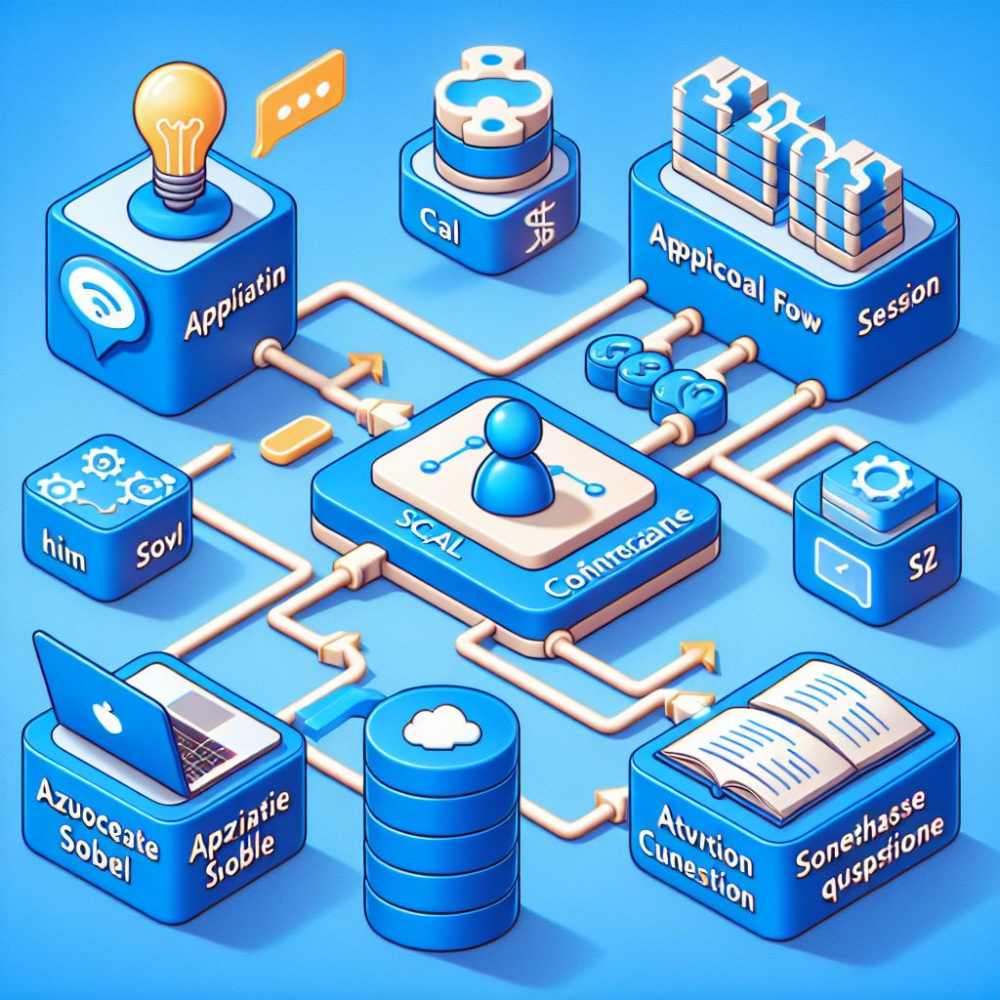

In [4]:
# Use case 1: Interacting with a SQL database

# Importing necessary libraries for database interaction
import sqlite3
import pandas as pd

### Before you ask question, get an idea of what the data is and what it was built for:

In [5]:
# Before asking questions about the data, you first need to understand what is the data that you have.
# Creates a variable with database name
database = 'chinook.db'

# Creating a connection to the database
dbconn = sqlite3.connect(database)

# Importing tables from the database
tables = pd.read_sql("""SELECT name, type
                        FROM sqlite_master
                        WHERE type IN ("table", "view");""", dbconn)

# Displays the tables found in the database for familiarization purpose
tables

,name,type
0,album,table
1,artist,table
2,customer,table
3,employee,table
4,genre,table
5,invoice,table
6,invoice_line,table
7,media_type,table
8,playlist,table
9,playlist_track,table


There are 11 tables in the chinook sample database.

#01: *employees* table stores employees data such as employee id, last name, first name, etc. It also has a field named ReportsTo to specify who reports to whom.

#02: *customers* table stores customers data.

#03 & #04: *invoices* & *invoice_items* tables: these two tables store invoice data. The invoices table stores invoice header data and the invoice_items table stores the invoice line items data.

#05: *artists* table stores artists data. It is a simple table that contains only the artist id and name.

#06: *albums* table stores data about a list of tracks. Each album belongs to one artist. However, one artist may have multiple albums.

#07: *media_types* table stores media types such as MPEG audio and AAC audio files.

#08: *genres table* stores music types such as rock, jazz, metal, etc.

#09: *tracks* table stores the data of songs. Each track belongs to one album.

#10 & #11: *playlists & playlist_track tables: playlists table store data about playlists. Each playlist contains a list of tracks. Each track may belong to multiple playlists. The relationship between the playlists table and tracks table is many-to-many. The playlist_track table is used to reflect this relationship.

Source: https://www.sqlitetutorial.net/sqlite-sample
-database/
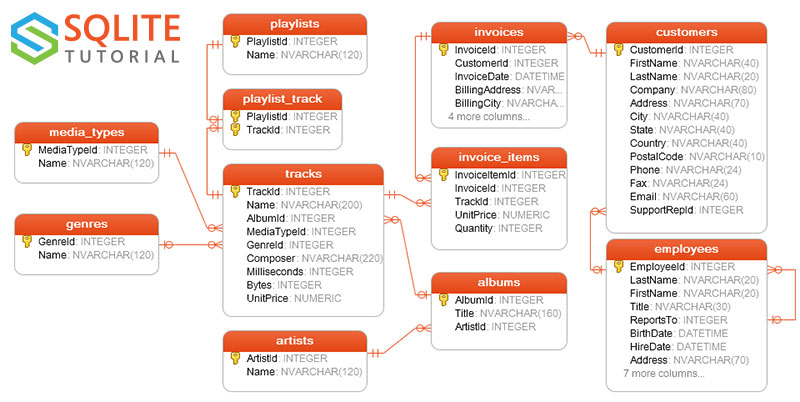ationship.

In [6]:
# Importing necessary modules for creating SQL agent from langchain
from langchain.agents import create_sql_agent
from langchain.agents.agent_toolkits import SQLDatabaseToolkit
from langchain.sql_database import SQLDatabase
from langchain.llms.openai import OpenAI
from langchain.agents import AgentExecutor
from langchain.agents.agent_types import AgentType
from langchain.chat_models import ChatOpenAI

# Creating an instance of SQLDatabase pointing to a local database on the same resource location where application also exist.
db = SQLDatabase.from_uri('sqlite:///chinook.db')

# Creating an instance of SQLDatabaseToolkit
toolkit = SQLDatabaseToolkit(db=db, llm=llm)

# Creating an instance of AgentExecutor
agent_executor = create_sql_agent(
    llm=llm,
    toolkit=toolkit,
    verbose=True,
    agent_type=AgentType.ZERO_SHOT_REACT_DESCRIPTION,
)

In [7]:
# Interacting with the SQL database and learning from the data
agent_executor.invoke("Describe the playlisttrack table")



> Entering new SQL Agent Executor chain...
I need to use the sql_db_schema tool to get the schema and sample rows for the playlisttrack table.
Action: sql_db_schema
Action Input: playlisttrackError: table_names {'playlisttrack'} not found in databaseThe playlisttrack table does not exist in the database. I should check the list of tables in the database to confirm.
Action: sql_db_list_tables
Action Input: ""album, artist, customer, employee, genre, invoice, invoice_line, media_type, playlist, playlist_track, trackThe playlisttrack table does not exist, but there is a playlist_track table. I should describe the playlist_track table instead.
Action: sql_db_schema
Action Input: playlist_track
CREATE TABLE playlist_track (
	playlist_id INTEGER NOT NULL, 
	track_id INTEGER NOT NULL, 
	PRIMARY KEY (playlist_id, track_id), 
	FOREIGN KEY(track_id) REFERENCES track (track_id), 
	FOREIGN KEY(playlist_id) REFERENCES playlist (playlist_id)
)

/*
3 rows from playlist_track table:
playlist_id	trac

{'input': 'Describe the playlisttrack table',
 'output': 'The playlist_track table has two columns: playlist_id and track_id, both of which are integers and cannot be null. These two columns together form the primary key of the table. The table also has foreign key constraints referencing the track and playlist tables. Here are some sample rows from the table:\n1. playlist_id: 1, track_id: 3402\n2. playlist_id: 1, track_id: 3389\n3. playlist_id: 1, track_id: 3390'}

In [8]:
# Interacting with the SQL database and learning from the data
agent_executor.invoke("What are the top 5 countries for sales?")



> Entering new SQL Agent Executor chain...
To answer this question, I need to find a table that contains information about sales and countries. I will start by listing all the tables in the database.
Action: sql_db_list_tables
Action Input: ""album, artist, customer, employee, genre, invoice, invoice_line, media_type, playlist, playlist_track, trackThe tables 'customer' and 'invoice' seem to be the most relevant for this question. I will check their schemas to see if they contain the necessary information.
Action: sql_db_schema
Action Input: customer, invoice
CREATE TABLE customer (
	customer_id INTEGER NOT NULL, 
	first_name NVARCHAR(40) NOT NULL, 
	last_name NVARCHAR(20) NOT NULL, 
	company NVARCHAR(80), 
	address NVARCHAR(70), 
	city NVARCHAR(40), 
	state NVARCHAR(40), 
	country NVARCHAR(40), 
	postal_code NVARCHAR(10), 
	phone NVARCHAR(24), 
	fax NVARCHAR(24), 
	email NVARCHAR(60) NOT NULL, 
	support_rep_id INTEGER, 
	PRIMARY KEY (customer_id), 
	FOREIGN KEY(support_rep_id) REFER

{'input': 'What are the top 5 countries for sales?',
 'output': 'The top 5 countries for sales are USA with $1040.49, Canada with $535.59, Brazil with $427.68, France with $389.07, and Germany with $334.62.'}

In [9]:
# Interacting with the SQL database and learning from the data
agent_executor.invoke('what is the total number of tracks and the average length of tracks by genre?')



> Entering new SQL Agent Executor chain...
To answer this question, I need to know the structure of the database. I need to find a table that contains information about tracks, their lengths, and their genres.
Action: sql_db_list_tables
Action Input: ""album, artist, customer, employee, genre, invoice, invoice_line, media_type, playlist, playlist_track, trackThe tables that could potentially contain the information I need are 'track' and 'genre'. I need to check the schema of these tables to understand their structure and the relationships between them.
Action: sql_db_schema
Action Input: "track, genre"
CREATE TABLE genre (
	genre_id INTEGER NOT NULL, 
	name NVARCHAR(120), 
	PRIMARY KEY (genre_id)
)

/*
3 rows from genre table:
genre_id	name
1	Rock
2	Jazz
3	Metal
*/


CREATE TABLE track (
	track_id INTEGER NOT NULL, 
	name NVARCHAR(200) NOT NULL, 
	album_id INTEGER, 
	media_type_id INTEGER NOT NULL, 
	genre_id INTEGER, 
	composer NVARCHAR(220), 
	milliseconds INTEGER NOT NULL, 
	byte

{'input': 'what is the total number of tracks and the average length of tracks by genre?',
 'output': 'The total number of tracks and the average length of tracks by genre are as follows: \n- Alternative: 40 tracks, average length 264058.525 milliseconds\n- Alternative & Punk: 332 tracks, average length 234353.84939759035 milliseconds\n- Blues: 81 tracks, average length 270359.77777777775 milliseconds\n- Bossa Nova: 15 tracks, average length 219590.0 milliseconds\n- Classical: 74 tracks, average length 293867.5675675676 milliseconds\n- Comedy: 17 tracks, average length 1585263.705882353 milliseconds\n- Drama: 64 tracks, average length 2575283.78125 milliseconds\n- Easy Listening: 24 tracks, average length 189164.20833333334 milliseconds\n- Electronica/Dance: 30 tracks, average length 302985.8 milliseconds\n- Heavy Metal: 28 tracks, average length 297452.9285714286 milliseconds\n- Hip Hop/Rap: 35 tracks, average length 178176.2857142857 milliseconds\n- Jazz: 130 tracks, average length 2

### Task 2 of 2
Similarly, it reads a CSV file and uses the AzureChatOpenAI model to ask questions about the data in the CSV file. The script demonstrates the power of AI in interacting with and learning from data.
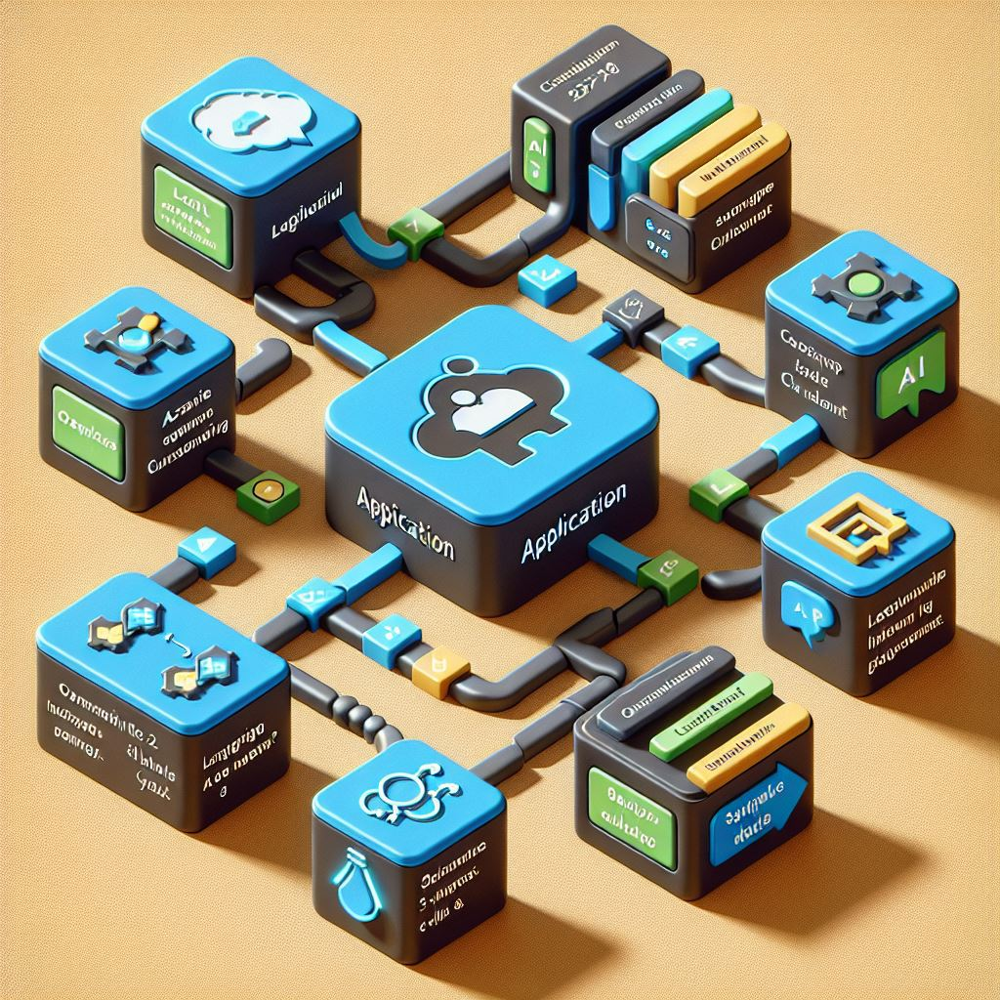

In [10]:
# Importing necessary modules for creating CSV agent
from langchain.agents.agent_types import AgentType
from langchain_experimental.agents.agent_toolkits import create_csv_agent
from langchain_openai import ChatOpenAI, OpenAI

In [11]:
# Creating an instance of CSV agent
agent = create_csv_agent(
    llm,
    "Activities.csv",
    verbose=True,
    agent_type=AgentType.ZERO_SHOT_REACT_DESCRIPTION,
)

In [13]:
# Interacting with the CSV file and learning from the data
agent.invoke("how many distinct activity types, grouped by year in descending order can be found in this csv file?")



> Entering new AgentExecutor chain...
Thought: To answer this question, I need to extract the year from the 'Date' column, then group by the year and 'Activity Type' column, and finally count the distinct activity types for each year. I will use the pandas library to do this. 

Action: python_repl_ast
Action Input: 
```python
# Convert 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract year from 'Date' column
df['Year'] = df['Date'].dt.year

# Group by 'Year' and 'Activity Type' and count distinct activity types
activity_counts = df.groupby(['Year', 'Activity Type']).size().reset_index(name='Counts')

# Sort by 'Year' in descending order
activity_counts = activity_counts.sort_values('Year', ascending=False)

activity_counts
```    Year            Activity Type  Counts
51  2024                  Walking       7
50  2024          Virtual Cycling       3
49  2024        Treadmill Running       2
48  2024            Trail Running       1
47  2024                 

{'input': 'how many distinct activity types, grouped by year in descending order can be found in this csv file?',
 'output': 'The number of distinct activity types for each year in descending order is as follows:\n\n2024: Walking (7), Virtual Cycling (3), Treadmill Running (2), Trail Running (1), Running (18), Pool Swimming (1), Breathwork (2)\n2023: Stand Up Paddleboarding (3), Breathwork (9), Cardio (16), Cycling (25), Running (35), Strength Training (7), Treadmill Running (10), Virtual Cycling (40), Walking (31), Yoga (1)\n2022: Yoga (7), Walking (39), Stand Up Paddleboarding (1), Running (63), Indoor Cycling (4), Cycling (36), Breathwork (10)\n2021: Yoga (10), Walking (134), Treadmill Running (4), Strength Training (2), Stand Up Paddleboarding (1), Running (104), Pool Swimming (1), Other (4), Cycling (29), Breathwork (36)\n2020: Cycling (49), Breathwork (1), Cardio (5), Pool Swimming (2), Running (97), Strength Training (1), Walking (59)\n2019: Cycling (5)\n2018: Running (3), Cycli

# Next Steps:
Now that we have a functional code sample. The next objective envisioned are:
1) Move keys and endpoints to keyvault to start implement security best practices
2) to build an application to run on a Web Browser (most likely using python and streamlit library) for a POC,
3) Allowing users to upload different CSV Files or to connect to a remote database such as Azure SQL.

In [14]:
# Interacting with the CSV file and learning from the data
agent.invoke("how many distinct activity types, grouped by year, presented in descending order of both year as first criteria and activity type as second criteria. If possible display the result in a tabular format using this csv file?")



> Entering new AgentExecutor chain...
Thought: To answer this question, I need to first convert the 'Date' column to datetime format, then extract the year from the 'Date' column and create a new column 'Year'. After that, I can group by 'Year' and 'Activity Type' and count the distinct activity types for each year. Finally, I will sort the result by 'Year' and 'Activity Type' in descending order. 

Action: python_repl_ast
Action Input: 
```python
# Convert 'Date' to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract year from 'Date' and create a new column 'Year'
df['Year'] = df['Date'].dt.year

# Group by 'Year' and 'Activity Type' and count distinct activity types
result = df.groupby(['Year', 'Activity Type']).size().reset_index(name='Count')

# Sort by 'Year' and 'Activity Type' in descending order
result = result.sort_values(['Year', 'Activity Type'], ascending=[False, False])

result
```    Year            Activity Type  Count
51  2024                  Walking  

{'input': 'how many distinct activity types, grouped by year, presented in descending order of both year as first criteria and activity type as second criteria. If possible display the result in a tabular format using this csv file?',
 'output': 'The distinct activity types, grouped by year, presented in descending order of both year as first criteria and activity type as second criteria are as shown in the table above.'}